In [1]:
# importing libraries

from sklearnex import patch_sklearn 
patch_sklearn()

import pandas as pd
import seaborn as sns
import datetime as dt
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

from sklearn.preprocessing import PowerTransformer
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import NearMiss

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import BernoulliNB
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV,cross_val_score,train_test_split
from sklearn.metrics import classification_report,accuracy_score,confusion_matrix,roc_auc_score,roc_curve,plot_roc_curve

Intel(R) Extension for Scikit-learn* enabled (https://github.com/intel/scikit-learn-intelex)


In [2]:
# printing all the columns and rows
pd.set_option("display.max_columns",None)
pd.set_option("display.min_rows",None)

In [3]:
#reading the data file
data=pd.read_csv(r"C:\Users\nitee\OneDrive\Desktop\niteen\Micro Credit Defaulter\Micro Credit Project\Data_file.csv")
data.head()

,Unnamed: 0,label,msisdn,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pcircle,pdate
0,1,0,21408I70789,272.0,3055.050000,3065.150000,220.13,260.13,2.0,0.0,1539,2,21.0,3078.0,1539.0,7.50,2,21,3078,1539.0,7.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,29.000000,29.000000,UPW,20-07-2016
1,2,1,76462I70374,712.0,12122.000000,12124.750000,3691.26,3691.26,20.0,0.0,5787,1,0.0,5787.0,5787.0,61.04,1,0,5787,5787.0,61.04,0.0,0.0,0,0,1,12,12.0,0.0,1.0,12,12,0.0,0.000000,0.000000,UPW,10-08-2016
2,3,1,17943I70372,535.0,1398.000000,1398.000000,900.13,900.13,3.0,0.0,1539,1,0.0,1539.0,1539.0,66.32,1,0,1539,1539.0,66.32,0.0,0.0,0,0,1,6,6.0,0.0,1.0,6,6,0.0,0.000000,0.000000,UPW,19-08-2016
3,4,1,55773I70781,241.0,21.228000,21.228000,159.42,159.42,41.0,0.0,947,0,0.0,0.0,0.0,0.00,1,0,947,947.0,2.50,0.0,0.0,0,0,2,12,6.0,0.0,2.0,12,6,0.0,0.000000,0.000000,UPW,06-06-2016
4,5,1,03813I82730,947.0,150.619333,150.619333,1098.90,1098.90,4.0,0.0,2309,7,2.0,20029.0,2309.0,29.00,8,2,23496,2888.0,35.00,0.0,0.0,0,0,7,42,6.0,0.0,7.0,42,6,0.0,2.333333,2.333333,UPW,22-06-2016


The dataset which shows the data  is my dataset in that label is my target column, i have to predict each loan
transaction,whether the customer will be paying back the loaned amount within 5 days of insurance of loan.
In this case,label'1'indicates that the loan has been payed i,e  Non-defaulter while ,label'0' indicates that
the loan has not been payed i,e is defaulter.So clearly it's a Classification problem.

# Data Information

* label : Flag indicating whether the user paid back the credit amount within 5 days of issuing the loan{1:success, 0:failure}
* msisdn : mobile number of user
* aon : age on cellular network in days
* daily_decr30 : Daily amount spent from main account, averaged over last 30 days (in Indonesian Rupiah)
* daily_decr90 : Daily amount spent from main account, averaged over last 90 days (in Indonesian Rupiah)
* rental30 : Average main account balance over last 30 days
* rental90 : Average main account balance over last 90 days
* last_rech_date_ma : Number of days till last recharge of main account
* last_rech_date_da: Number of days till last recharge of data account
* last_rech_amt_ma : Amount of last recharge of main account (in Indonesian Rupiah)
* cnt_ma_rech30 : Number of times main account got recharged in last 30 days
* fr_ma_rech30 : Frequency of main account recharged in last 30 days
* sumamnt_ma_rech30 : Total amount of recharge in main account over last 30 days (in Indonesian Rupiah)
* medianamnt_ma_rech30 : Median of amount of recharges done in main account over last 30 days at user level (in Indonesian Rupiah)
* medianmarechprebal30 : Median of main account balance just before recharge in last 30 days at user level (in Indonesian Rupiah)
* cnt_ma_rech90 : Number of times main account got recharged in last 90 days
* fr_ma_rech90 : Frequency of main account recharged in last 90 days
* sumamnt_ma_rech90 : Total amount of recharge in main account over last 90 days (in Indonasian Rupiah)
* medianamnt_ma_rech90 : Median of amount of recharges done in main account over last 90 days at user level (in Indonasian Rupiah)
* medianmarechprebal90 : Median of main account balance just before recharge in last 90 days at user level (in Indonasian Rupiah)
* cnt_da_rech30 : Number of times data account got recharged in last 30 days
* fr_da_rech30: Frequency of data account recharged in last 30 days
* cnt_da_rech90 : Number of times data account got recharged in last 90 days
* fr_da_rech90 : Frequency of data account recharged in last 90 days
* cnt_loans30 : Number of loans taken by user in last 30 days
* amnt_loans30: Total amount of loans taken by user in last 30 days
* maxamnt_loans30 : maximum amount of loan taken by the user in last 30 days
* medianamnt_loans30 : Median of amounts of loan taken by the user in last 30 days
* cnt_loans90 : Number of loans taken by user in last 90 days
* amnt_loans90 : Total amount of loans taken by user in last 90 days
* maxamnt_loans90 : maximum amount of loan taken by the user in last 90 days
* medianamnt_loans90 : Median of amounts of loan taken by the user in last 90 days
* payback30 : Average payback time in days over last 30 days
* payback90 : Average payback time in days over last 90 days
* pcircle : telecom circle
* pdate : date


# Data Preprocessing & EDA

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 209593 entries, 0 to 209592
Data columns (total 37 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Unnamed: 0            209593 non-null  int64  
 1   label                 209593 non-null  int64  
 2   msisdn                209593 non-null  object 
 3   aon                   209593 non-null  float64
 4   daily_decr30          209593 non-null  float64
 5   daily_decr90          209593 non-null  float64
 6   rental30              209593 non-null  float64
 7   rental90              209593 non-null  float64
 8   last_rech_date_ma     209593 non-null  float64
 9   last_rech_date_da     209593 non-null  float64
 10  last_rech_amt_ma      209593 non-null  int64  
 11  cnt_ma_rech30         209593 non-null  int64  
 12  fr_ma_rech30          209593 non-null  float64
 13  sumamnt_ma_rech30     209593 non-null  float64
 14  medianamnt_ma_rech30  209593 non-null  float64
 15  

there are only 3 Categorical features namely 'msisdn','pcircle' and 'pdate'

In [5]:
data.isnull().sum()

Unnamed: 0              0
label                   0
msisdn                  0
aon                     0
daily_decr30            0
daily_decr90            0
rental30                0
rental90                0
last_rech_date_ma       0
last_rech_date_da       0
last_rech_amt_ma        0
cnt_ma_rech30           0
fr_ma_rech30            0
sumamnt_ma_rech30       0
medianamnt_ma_rech30    0
medianmarechprebal30    0
cnt_ma_rech90           0
fr_ma_rech90            0
sumamnt_ma_rech90       0
medianamnt_ma_rech90    0
medianmarechprebal90    0
cnt_da_rech30           0
fr_da_rech30            0
cnt_da_rech90           0
fr_da_rech90            0
cnt_loans30             0
amnt_loans30            0
maxamnt_loans30         0
medianamnt_loans30      0
cnt_loans90             0
amnt_loans90            0
maxamnt_loans90         0
medianamnt_loans90      0
payback30               0
payback90               0
pcircle                 0
pdate                   0
dtype: int64

clealry there are no NULL values in the dataset

In [6]:
data.nunique()

Unnamed: 0              209593
label                        2
msisdn                  186243
aon                       4507
daily_decr30            146328
daily_decr90            155483
rental30                131338
rental90                139036
last_rech_date_ma         1186
last_rech_date_da         1174
last_rech_amt_ma            70
cnt_ma_rech30               71
fr_ma_rech30              1083
sumamnt_ma_rech30        15141
medianamnt_ma_rech30       510
medianmarechprebal30     23907
cnt_ma_rech90              110
fr_ma_rech90                89
sumamnt_ma_rech90        31771
medianamnt_ma_rech90       608
medianmarechprebal90     22694
cnt_da_rech30             1066
fr_da_rech30              1072
cnt_da_rech90               27
fr_da_rech90                46
cnt_loans30                 40
amnt_loans30                48
maxamnt_loans30           1050
medianamnt_loans30           6
cnt_loans90               1110
amnt_loans90                69
maxamnt_loans90              3
medianam

* As columns like 'Unnamed: 0' and 'msisdn' are not providing any relevant info so we can drop these columns 
* also 'pcircle' has only one value throughout so it's not going to affect the target variable either so we can drop it too

In [7]:
# dropping columns 'Unnamed: 0' and 'msisdn'
data.drop(['Unnamed: 0','msisdn','pcircle'],axis=1,inplace=True)

In [8]:
data.describe()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90
count,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.00000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000,209593.000000
mean,0.875177,8112.343445,5381.402289,6082.515068,2692.581910,3483.406534,3755.84780,3712.202921,2064.452797,3.978057,3737.355121,7704.501157,1812.817952,3851.927942,6.31543,7.716780,12396.218352,1864.595821,92.025541,262.578110,3749.494447,0.041495,0.045712,2.758981,17.952021,274.658747,0.054029,18.520919,23.645398,6.703134,0.046077,3.398826,4.321485
std,0.330519,75696.082531,9220.623400,10918.812767,4308.586781,5770.461279,53905.89223,53374.833430,2370.786034,4.256090,53643.625172,10139.621714,2070.864620,54006.374433,7.19347,12.590251,16857.793882,2081.680664,369.215658,4183.897978,53885.414979,0.397556,0.951386,2.554502,17.379741,4245.264648,0.218039,224.797423,26.469861,2.103864,0.200692,8.813729,10.308108
min,0.000000,-48.000000,-93.012667,-93.012667,-23737.140000,-24720.580000,-29.00000,-29.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-200.000000,0.00000,0.000000,0.000000,0.000000,-200.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,246.000000,42.440000,42.692000,280.420000,300.260000,1.00000,0.000000,770.000000,1.000000,0.000000,1540.000000,770.000000,11.000000,2.00000,0.000000,2317.000000,773.000000,14.600000,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,6.000000,0.000000,1.000000,6.000000,6.000000,0.000000,0.000000,0.000000
50%,1.000000,527.000000,1469.175667,1500.000000,1083.570000,1334.000000,3.00000,0.000000,1539.000000,3.000000,2.000000,4628.000000,1539.000000,33.900000,4.00000,2.000000,7226.000000,1539.000000,36.000000,0.000000,0.000000,0.000000,0.000000,2.000000,12.000000,6.000000,0.000000,2.000000,12.000000,6.000000,0.000000,0.000000,1.666667
75%,1.000000,982.000000,7244.000000,7802.790000,3356.940000,4201.790000,7.00000,0.000000,2309.000000,5.000000,6.000000,10010.000000,1924.000000,83.000000,8.00000,8.000000,16000.000000,1924.000000,79.310000,0.000000,0.000000,0.000000,0.000000,4.000000,24.000000,6.000000,0.000000,5.000000,30.000000,6.000000,0.000000,3.750000,4.500000
max,1.000000,999860.755200,265926.000000,320630.000000,198926.110000,200148.110000,998650.37770,999171.809400,55000.000000,203.000000,999606.368100,810096.000000,55000.000000,999479.419300,336.00000,88.000000,953036.000000,55000.000000,41456.500000,99914.441420,999809.240100,38.000000,64.000000,50.000000,306.000000,99864.560860,3.000000,4997.517944,438.000000,12.000000,3.000000,171.500000,171.500000


* as we can see there are some negative values in few features but negative values are not acceptable according to data desciption. so we'll treat them accordingly
* we can also see combinations of related columns and that we shall confirm by performing EDA and treat them accordingly.
* we can also see a very high frequency of zero value for some feature.
* and also they are outliers and we need to fix them after doing some more EDA

### Feature Extraction

In [9]:
# converting object data type to datetime datatype
data['pdate'] =  pd.to_datetime(data['pdate'])

# Extracting paid year,month and day from pdate

# Extracting year
data["pyear"]=pd.to_datetime(data.pdate, format="%d/%m/%Y").dt.year

# Extracting month
data["pmonth"]=pd.to_datetime(data.pdate, format="%d/%m/%Y").dt.month

# Extracting day
data["pday"]=pd.to_datetime(data.pdate, format="%d/%m/%Y").dt.day

In [10]:
print("unique values in year : ",data.pyear.nunique(),"\n","unique values in month : ",
      data.pmonth.nunique(),"\n","unique values in day : ",data.pday.nunique())

unique values in year :  1 
 unique values in month :  12 
 unique values in day :  22


since there is only one value in 'pyear' we can drop the column

In [11]:
data.drop(['pyear','pdate'],axis=1,inplace=True)

### Negative values treatment

In [12]:
# check for columns with negative values
neg_col=[]

for i in data.columns:
    if data[i].min()<0:
        neg_col.append(i)
        
neg_col

['aon',
 'daily_decr30',
 'daily_decr90',
 'rental30',
 'rental90',
 'last_rech_date_ma',
 'last_rech_date_da',
 'medianmarechprebal30',
 'medianmarechprebal90']

In [13]:
# converting records with negative values into positive values for these columns
for i in neg_col:
    data[i]=abs(data[i])

### Related features treatment

we could observe many related columns from the dataset so lets check if they are related or not statistically

In [14]:
data.corr()

,label,aon,daily_decr30,daily_decr90,rental30,rental90,last_rech_date_ma,last_rech_date_da,last_rech_amt_ma,cnt_ma_rech30,fr_ma_rech30,sumamnt_ma_rech30,medianamnt_ma_rech30,medianmarechprebal30,cnt_ma_rech90,fr_ma_rech90,sumamnt_ma_rech90,medianamnt_ma_rech90,medianmarechprebal90,cnt_da_rech30,fr_da_rech30,cnt_da_rech90,fr_da_rech90,cnt_loans30,amnt_loans30,maxamnt_loans30,medianamnt_loans30,cnt_loans90,amnt_loans90,maxamnt_loans90,medianamnt_loans90,payback30,payback90,pmonth,pday
label,1.000000,-0.003788,0.168293,0.166146,0.058645,0.076033,0.003730,0.001711,0.131804,0.237331,0.001330,0.202828,0.141490,-0.004843,0.236392,0.084385,0.205793,0.120855,0.037126,0.003827,-0.000027,0.002999,-0.005418,0.196283,0.197272,0.000248,0.044589,0.004733,0.199788,0.084144,0.035747,0.048336,0.049183,0.005093,0.020168
aon,-0.003788,1.000000,0.001101,0.000371,-0.000796,-0.000693,0.001692,-0.001693,0.004253,-0.003152,-0.001163,0.000703,0.004303,0.003930,-0.002729,0.004400,0.001007,0.004906,-0.000982,0.001564,0.000892,0.001121,0.005395,-0.001830,-0.001730,-0.002764,0.004665,-0.000611,-0.002323,-0.001193,0.002772,0.001938,0.002201,0.000903,0.000255
daily_decr30,0.168293,0.001101,1.000000,0.977704,0.441532,0.459200,0.000484,-0.001636,0.275836,0.451383,-0.000577,0.636535,0.295355,-0.001160,0.587337,-0.078301,0.762981,0.257846,0.036432,0.000700,-0.001499,0.038814,0.020672,0.366114,0.471490,-0.000028,-0.011611,0.008962,0.563495,0.400199,-0.037305,0.026914,0.047174,0.101704,0.024895
daily_decr90,0.166146,0.000371,0.977704,1.000000,0.434106,0.471894,0.000905,-0.001886,0.264130,0.426706,-0.000343,0.603885,0.282959,-0.000753,0.593068,-0.079531,0.768816,0.250518,0.035318,0.000661,-0.001570,0.031155,0.016437,0.340385,0.447867,0.000025,-0.005592,0.009446,0.567203,0.397251,-0.034686,0.019399,0.040799,0.122772,-0.009148
rental30,0.058645,-0.000796,0.441532,0.434106,1.000000,0.955014,-0.001177,0.003169,0.134436,0.235484,-0.001207,0.285599,0.138196,-0.001367,0.312944,-0.033150,0.350876,0.118533,0.028351,-0.000954,-0.002359,0.072559,0.047158,0.181107,0.234186,-0.000751,-0.016536,0.004084,0.298886,0.234106,-0.035429,0.072888,0.094828,0.072149,0.052949
rental90,0.076033,-0.000693,0.459200,0.471894,0.955014,1.000000,-0.001781,0.002690,0.127888,0.231900,-0.000525,0.270504,0.127414,-0.001211,0.346136,-0.036160,0.368419,0.110478,0.030613,-0.000167,-0.002222,0.056549,0.037249,0.172183,0.232432,-0.001352,-0.009516,0.005183,0.327480,0.251250,-0.034113,0.067003,0.099257,0.098406,0.021270
last_rech_date_ma,0.003730,0.001692,0.000484,0.000905,-0.001177,-0.001781,1.000000,0.001790,-0.000146,0.004308,-0.001629,0.002103,-0.001357,0.004071,0.004260,0.001419,0.002241,-0.000725,-0.001089,-0.003468,-0.003626,-0.003538,-0.002395,0.001190,0.000900,0.000929,0.001835,-0.000226,0.000867,-0.001124,0.002771,-0.002235,-0.001585,-0.000924,0.000753
last_rech_date_da,0.001711,-0.001693,-0.001636,-0.001886,0.003169,0.002690,0.001790,1.000000,-0.000149,0.001549,0.001158,0.000046,0.001037,0.002847,0.001272,0.000798,-0.000414,0.000219,0.003930,-0.003628,-0.000074,-0.001859,-0.000203,0.000380,0.000536,0.000503,0.000061,-0.000972,0.000519,0.001524,-0.002239,0.000077,0.000417,-0.000530,0.000660
last_rech_amt_ma,0.131804,0.004253,0.275836,0.264130,0.134436,0.127888,-0.000146,-0.000149,1.000000,-0.002662,0.002876,0.440821,0.794646,-0.002344,0.016707,0.106267,0.418735,0.818734,0.124681,-0.001837,-0.003230,0.014779,0.016042,-0.027612,0.008502,0.001000,0.028370,0.000093,0.014067,0.148460,0.021004,-0.027369,-0.014260,0.023358,0.032715
cnt_ma_rech30,0.237331,-0.003152,0.451383,0.426706,0.235484,0.231900,0.004308,0.001549,-0.002662,1.000000,0.001669,0.656986,-0.011792,0.000079,0.886433,-0.152759,0.584060,-0.051347,0.012728,0.002306,-0.002732,0.011981,0.006989,0.765802,0.752296,0.000109,-0.067011,0.014703,0.685257,0.174104,-0.071451,0.043617,0.017362,0.024767,0.080003


from the above table we have gathered that below combination of features are strongly related
* 'daily_decr30', 'daily_decr90'
* 'rental30','rental90'
* 'cnt_ma_rech30','cnt_ma_rech90'
* 'sumamnt_ma_rech90','sumamnt_ma_rech30'
* 'medianamnt_ma_rech90','medianamnt_ma_rech30'
* 'cnt_loans30','amnt_loans30'
* 'cnt_loans30','amnt_loans90'
* 'amnt_loans30','amnt_loans90'
* 'medianamnt_loans30','medianamnt_loans90'
* 'payback30', 'payback90'

lets conclude above observation through graphical analysis

In [15]:
col=['daily_decr30', 'daily_decr90','rental30','rental90','cnt_ma_rech30','cnt_ma_rech90',
'sumamnt_ma_rech90','sumamnt_ma_rech30','medianamnt_ma_rech90','medianamnt_ma_rech30','cnt_loans30','amnt_loans30',
'cnt_loans30','amnt_loans90','amnt_loans30','amnt_loans90','medianamnt_loans30','medianamnt_loans90',
'payback30', 'payback90']

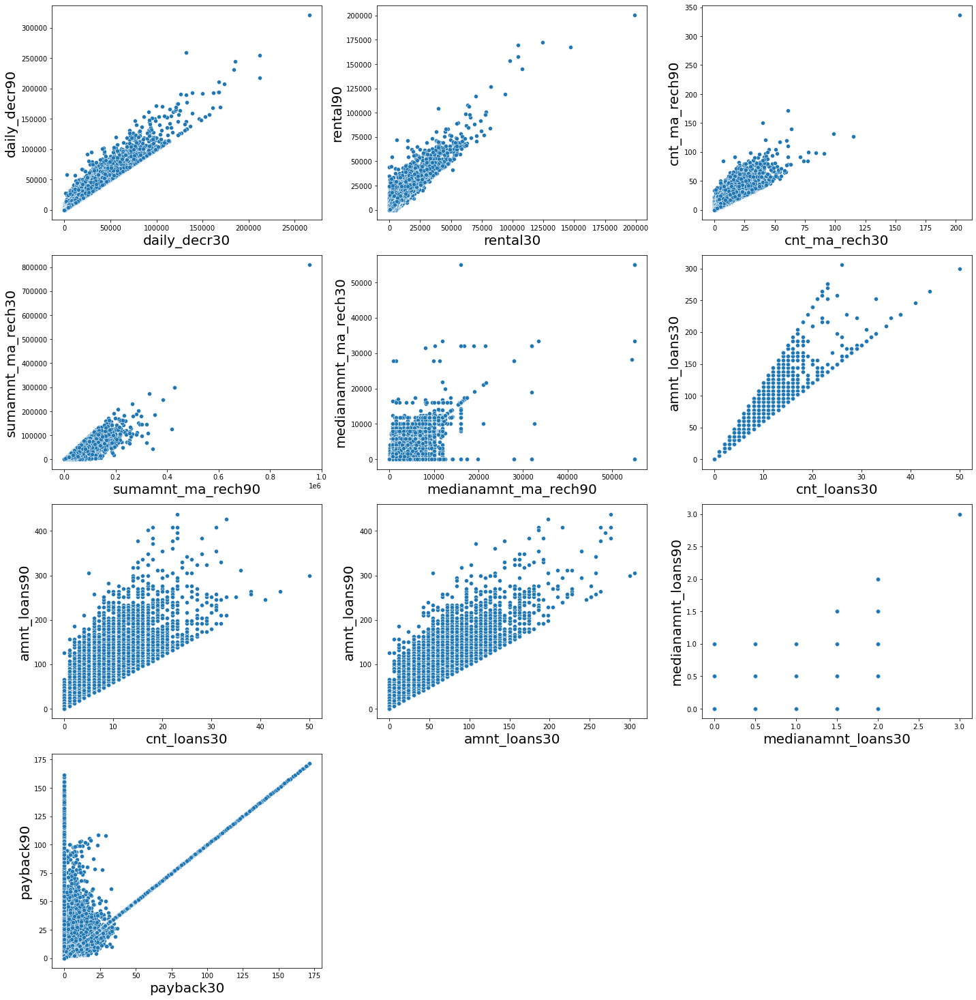

In [16]:
# identifying the relation using scatterplot

plt.figure(figsize=(20,25),facecolor='white')

plotnumber=1
j=0
for i in range(10):
    if (plotnumber<=15):
        ax=plt.subplot(5,3,plotnumber)
        sns.scatterplot(data[col[j]],data[col[j+1]])
        plt.xlabel(col[j],fontsize=20)
        plt.ylabel(col[j+1],fontsize=20)
    
    j=j+2    
    plotnumber+=1
    
plt.tight_layout()

as we can see some combinations are strongly correlated according to visualization too
* 'daily_decr30', 'daily_decr90'
* 'rental30','rental90'
* 'cnt_ma_rech30','cnt_ma_rech90'
* 'sumamnt_ma_rech90','sumamnt_ma_rech30'

* 'cnt_loans30','amnt_loans30'
* 'cnt_loans30','amnt_loans90'
* 'amnt_loans30','amnt_loans90'

so we need to drop one of the features from each combination as per their lesser relation with the target variable
* 'daily_decr90'
* 'rental30'
* 'cnt_ma_rech90'
* 'sumamnt_ma_rech30'
* 'cnt_loans30'
* 'amnt_loans30

In [17]:
# dropping the columns
data.drop(['daily_decr90','rental30','cnt_ma_rech90','sumamnt_ma_rech30','cnt_loans30','amnt_loans30'],axis=1,inplace=True)
data.shape

(209593, 29)

### High frequency of zero value for some feature

In [18]:
# check for percentage of zero for each column
cols=data.columns
percent=[]

for col in data.columns:
    cnt=len(data[data[col]==0])
    percent.append((cnt/data.shape[0])*100)
    
len(percent)

zero_data=pd.DataFrame(list(zip(cols,percent)),columns=['columns','percent'])
# columns with percentage of zero value above 90 %
col=zero_data[zero_data['percent']>90]
col

,columns,percent
5,last_rech_date_da,96.788061
15,cnt_da_rech30,98.037148
16,fr_da_rech30,99.246635
17,cnt_da_rech90,97.439323
18,fr_da_rech90,99.587295
20,medianamnt_loans30,93.249775
24,medianamnt_loans90,94.193985


As we can see these features contain very high frequncy of zeroes and so they are not affecting the target variable much and hence we can drop them.

In [19]:
# dropping the columns
data.drop(col['columns'],axis=1,inplace=True)
data.shape

(209593, 22)

### Outlier Detection

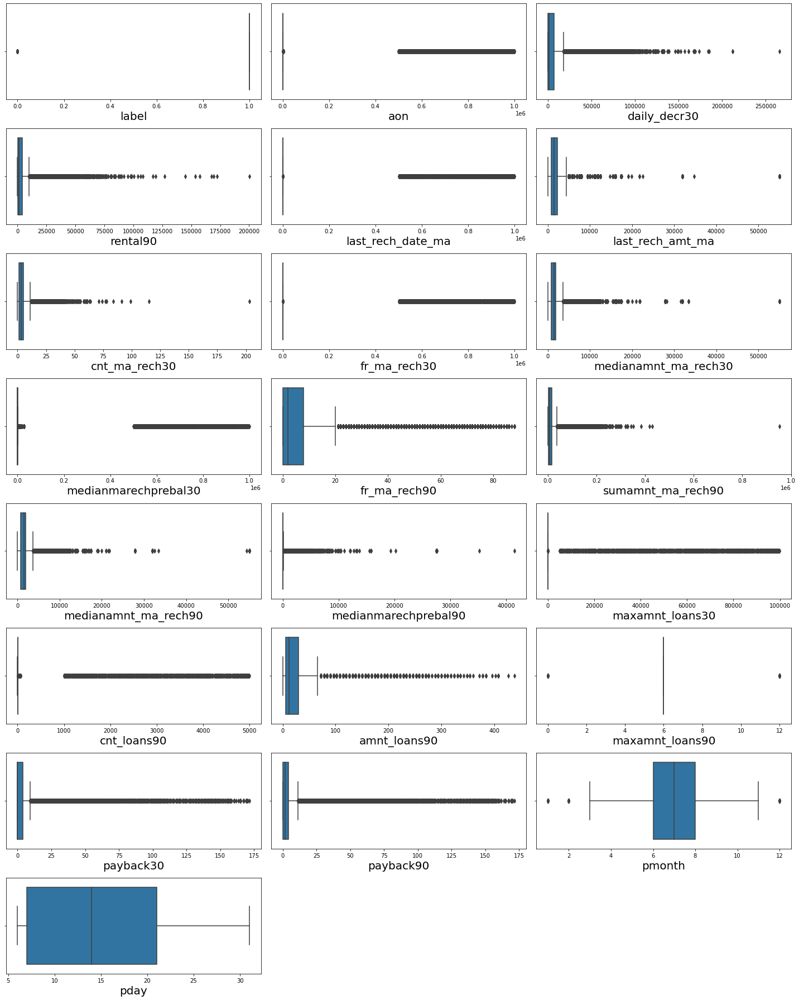

In [20]:
# lets check for the outliers 

plt.figure(figsize=(20,25))
plotnumber=1

for column in data:
    if plotnumber<=22:     # as there are 29 columns in the x
        ax=plt.subplot(8,3,plotnumber) 
        sns.boxplot(data[column],orient='v')
        plt.xlabel(column, fontsize=20)
        
    plotnumber+=1
    
plt.tight_layout()    

as we can see there are many outliers present in the dataset

In [21]:
# features with large outliers and unacceptable values
col=['aon','last_rech_date_ma','fr_ma_rech30','medianmarechprebal30','medianmarechprebal90','maxamnt_loans30','cnt_loans90']

In [22]:
# using 99% percentile method to remove the outliers
for i in col:
    data=data[data[i]<=data[i].quantile(0.99)]
data.shape

(196422, 22)

In [24]:
# now we shall use capping method to treat other outliers where values are not unrealistic
#col=['daily_decr30','rental90','last_rech_amt_ma','cnt_ma_rech30','medianamnt_ma_rech30','fr_ma_rech90','sumamnt_ma_rech90',
#    'medianamnt_ma_rech90','amnt_loans90','payback30','payback90']

# capping
#for i in col:
#    data[i]=np.where(data[i]>data[i].quantile(0.99),data[i].quantile(0.99),data[i])

#data.shape

(196422, 22)

since outliers are handled lets check for data distribution

### Checking for Skewness

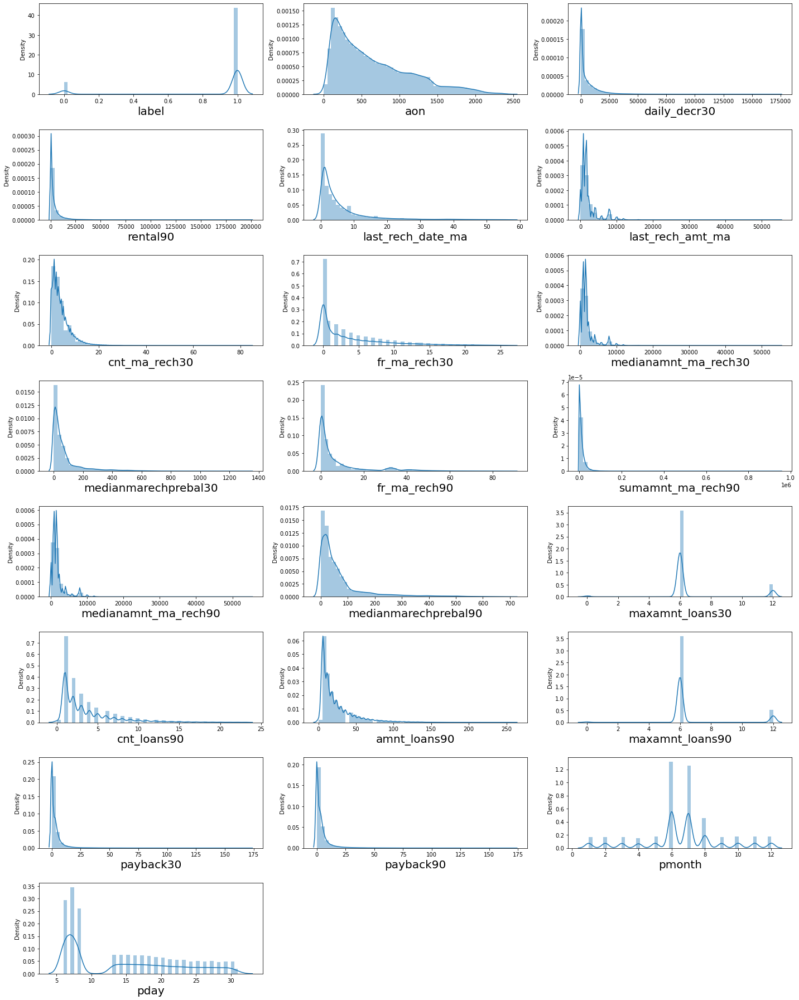

In [23]:
# lets see how data is distributed for every column

plt.figure(figsize=(20,25))
plotnumber=1

for column in data:
    if plotnumber<=22:     # as there are 22 columns in the x
        ax=plt.subplot(8,3,plotnumber) 
        sns.distplot(data[column])
        plt.xlabel(column, fontsize=20)
        
    plotnumber+=1
    
plt.tight_layout()    

as we can see the data is quite right skewed for almost all the features. lets check it statistically.

In [24]:
# checking for skewness in the dataset
data.skew()

label                  -2.264975
aon                     0.952002
daily_decr30            3.619217
rental90                4.548685
last_rech_date_ma       2.886677
last_rech_amt_ma        3.738299
cnt_ma_rech30           2.316212
fr_ma_rech30            1.747338
medianamnt_ma_rech30    3.479062
medianmarechprebal30    3.290710
fr_ma_rech90            2.314335
sumamnt_ma_rech90       4.764105
medianamnt_ma_rech90    3.563474
medianmarechprebal90    2.799722
maxamnt_loans30         1.464749
cnt_loans90             2.108853
amnt_loans90            2.290366
maxamnt_loans90         1.718431
payback30               8.274232
payback90               6.859856
pmonth                 -0.094288
pday                    0.470629
dtype: float64

except label,pmonth and pday , all the features are skewed. lets fix it

In [25]:
data.columns

Index(['label', 'aon', 'daily_decr30', 'rental90', 'last_rech_date_ma',
       'last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30',
       'medianamnt_ma_rech30', 'medianmarechprebal30', 'fr_ma_rech90',
       'sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90',
       'maxamnt_loans30', 'cnt_loans90', 'amnt_loans90', 'maxamnt_loans90',
       'payback30', 'payback90', 'pmonth', 'pday'],
      dtype='object')

In [26]:
#Creating a list of skewed features
fea=['aon', 'daily_decr30', 'rental90', 'last_rech_date_ma','last_rech_amt_ma', 'cnt_ma_rech30', 'fr_ma_rech30',
    'medianamnt_ma_rech30', 'medianmarechprebal30', 'fr_ma_rech90','sumamnt_ma_rech90', 'medianamnt_ma_rech90', 'medianmarechprebal90',
       'maxamnt_loans30', 'cnt_loans90', 'amnt_loans90', 'maxamnt_loans90','payback30', 'payback90']

#Using yeo_johnson method i am removing the skewness 
scaler = PowerTransformer(method='yeo-johnson')
data[fea] = scaler.fit_transform(data[fea].values)

# checking skewness again
data.skew()

label                  -2.264975
aon                    -0.056911
daily_decr30           -0.133314
rental90               -0.040258
last_rech_date_ma       0.038470
last_rech_amt_ma       -0.074015
cnt_ma_rech30          -0.003748
fr_ma_rech30            0.127051
medianamnt_ma_rech30   -0.183916
medianmarechprebal30   -0.051757
fr_ma_rech90            0.139234
sumamnt_ma_rech90      -0.214374
medianamnt_ma_rech90   -0.060831
medianmarechprebal90   -0.034757
maxamnt_loans30         0.418108
cnt_loans90             0.095134
amnt_loans90           -0.003951
maxamnt_loans90         0.362411
payback30               0.285271
payback90               0.200220
pmonth                 -0.094288
pday                    0.470629
dtype: float64

### checking correlation 

lets take the graphical representation to understand better relation with the target variable

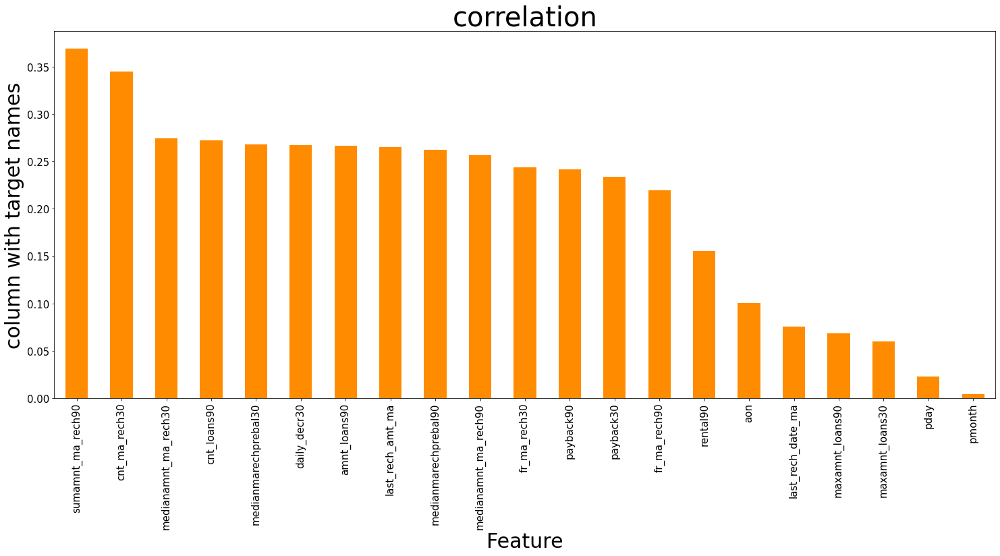

In [27]:
plt.figure(figsize=(25,10))
data.corr()['label'].sort_values(ascending=False).drop(['label']).plot(kind='bar',color='darkorange')
plt.xlabel('Feature',fontsize=30)
plt.ylabel('column with target names',fontsize=30)
plt.xticks(fontsize=15)  
plt.yticks(fontsize=15)
plt.title('correlation',fontsize=40)
plt.show()

pday & pmonth are not highly related with the target variable so we can drop it 

In [28]:
# separating features and target
x = data.drop(columns=['label','pday','pmonth'],axis=1)
y = data["label"]

In [29]:
# scaling the data using standard scalar

scaler=StandardScaler()
X = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)

#### checking the balance of target variable

In [30]:
y.value_counts()

1    171829
0     24593
Name: label, dtype: int64

clearly the data look imbalanced. we shall balance it using oversampling because we can't loose data

In [31]:
SM = SMOTE()
X, y = SM.fit_resample(X,y)

### Finding Best Random State and Accuracy:

In [32]:
'''
from sklearn.tree import DecisionTreeClassifier
maxAccu=0
maxRS=0
for i in range(1,200):
    X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=.25, random_state =i)
    mod = DecisionTreeClassifier()
    mod.fit(X_train, y_train)
    pred = mod.predict(X_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)
'''

'\nfrom sklearn.tree import DecisionTreeClassifier\nmaxAccu=0\nmaxRS=0\nfor i in range(1,200):\n    X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=.25, random_state =i)\n    mod = DecisionTreeClassifier()\n    mod.fit(X_train, y_train)\n    pred = mod.predict(X_test)\n    acc=accuracy_score(y_test, pred)\n    if acc>maxAccu:\n        maxAccu=acc\n        maxRS=i\nprint("Best accuracy is ",maxAccu," on Random_state ",maxRS)\n'

Got the best accuracy and random state.

In [33]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.25,random_state=324)

### Classification Algorithms:

#### 1. XGB Classifier:

In [34]:
XGB=XGBClassifier(verbosity=0)
XGB.fit(X_train,y_train)
predxg=XGB.predict(X_test)
Accuracy_Score = accuracy_score(y_test, predxg)*100
print('Accuracy Score:',Accuracy_Score)
print('Confusion Matrix:',confusion_matrix(y_test, predxg))
print(classification_report(y_test,predxg))

#cross validation score
scores = cross_val_score(XGB, X, y, cv = 5).mean()*100
print("\nCross validation score :", scores)

#difference of accuracy and cv score
diff = Accuracy_Score - scores
print("Accuracy_Score - Cross Validation Score :", diff)

Accuracy Score: 93.0082057847873
Confusion Matrix: [[39690  3421]
 [ 2586 40218]]
              precision    recall  f1-score   support

           0       0.94      0.92      0.93     43111
           1       0.92      0.94      0.93     42804

    accuracy                           0.93     85915
   macro avg       0.93      0.93      0.93     85915
weighted avg       0.93      0.93      0.93     85915


Cross validation score : 92.08342715139898
Accuracy_Score - Cross Validation Score : 0.9247786333883141


XGBClassifier is giving me 92.78% accuracy.

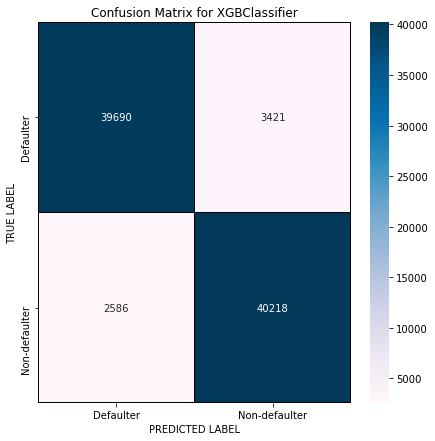

In [35]:
cm = confusion_matrix(y_test, predxg)

x_axis_labels = ["Defaulter","Non-defaulter"]
y_axis_labels = ["Defaulter","Non-defaulter"]

f, ax = plt.subplots(figsize =(7,7))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="PuBu", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for XGBClassifier')
plt.show()

* We can see the true values and predicted values in XGB Classifier model using confusion matrix.

#### 2.DecisionTreeClassifier:

In [36]:
DTC=DecisionTreeClassifier()
DTC.fit(X_train,y_train)
preddt=DTC.predict(X_test)
Accuracy_Score = accuracy_score(y_test, preddt)*100
print('Accuracy Score:',Accuracy_Score)
print('Confusion Matrix:',confusion_matrix(y_test, preddt))
print(classification_report(y_test,preddt))

#cross validation score
scores = cross_val_score(DTC, X, y, cv = 5).mean()*100
print("\nCross validation score :", scores)

#difference of accuracy and cv score
diff = Accuracy_Score - scores
print("\Accuracy_Score - Cross Validation Score :", diff)

Accuracy Score: 88.48047488797067
Confusion Matrix: [[38610  4501]
 [ 5396 37408]]
              precision    recall  f1-score   support

           0       0.88      0.90      0.89     43111
           1       0.89      0.87      0.88     42804

    accuracy                           0.88     85915
   macro avg       0.88      0.88      0.88     85915
weighted avg       0.88      0.88      0.88     85915


Cross validation score : 88.39108256508291
\Accuracy_Score - Cross Validation Score : 0.08939232288776111


DecisionTreeClassifier is giving me 88.4% accuracy.

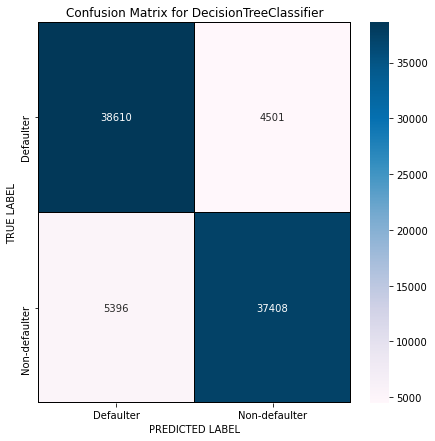

In [37]:
cm = confusion_matrix(y_test, preddt)

x_axis_labels = ["Defaulter","Non-defaulter"]
y_axis_labels = ["Defaulter","Non-defaulter"]

f, ax = plt.subplots(figsize =(7,7))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="PuBu", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for DecisionTreeClassifier')
plt.show()

* We can see the true values and predicted values in DecisionTreeClassifier model using confusion matrix.

#### 3.RandomForestClassifier:

In [38]:
RF=RandomForestClassifier()
RF.fit(X_train,y_train)
predrf=RF.predict(X_test)
Accuracy_Score = accuracy_score(y_test, predrf)*100
print('Accuracy Score:',Accuracy_Score)
print('Confusion Matrix:',confusion_matrix(y_test, predrf))
print(classification_report(y_test,predrf))

#cross validation score
scores = cross_val_score(RF, X, y, cv = 5).mean()*100
print("\nCross validation score :", scores)

#difference of accuracy and cv score
diff = Accuracy_Score - scores
print("\Accuracy_Score - Cross Validation Score :", diff)

Accuracy Score: 94.14072047954375
Confusion Matrix: [[40689  2422]
 [ 2612 40192]]
              precision    recall  f1-score   support

           0       0.94      0.94      0.94     43111
           1       0.94      0.94      0.94     42804

    accuracy                           0.94     85915
   macro avg       0.94      0.94      0.94     85915
weighted avg       0.94      0.94      0.94     85915


Cross validation score : 94.06387584514869
\Accuracy_Score - Cross Validation Score : 0.07684463439505862


RandomForestClassifier is giving me 94% accuracy.

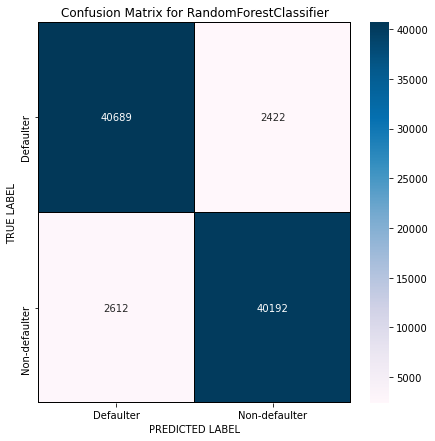

In [39]:
cm = confusion_matrix(y_test, predrf)

x_axis_labels = ["Defaulter","Non-defaulter"]
y_axis_labels = ["Defaulter","Non-defaulter"]

f, ax = plt.subplots(figsize =(7,7))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="PuBu", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for RandomForestClassifier')
plt.show()

* We can see the true values and predicted values in BaggingClassifier model using confusion matrix.

#### 4.Support Vector Classifier:

In [40]:
svc=SVC()
svc.fit(X_train,y_train)
predab=svc.predict(X_test)
Accuracy_Score = accuracy_score(y_test, predab)*100
print('Accuracy Score:',Accuracy_Score)
print('Confusion Matrix:',confusion_matrix(y_test, predab))
print(classification_report(y_test,predab))

#cross validation score
#scores = cross_val_score(svc, X, y, cv = 5).mean()*100
#print("\nCross validation score :", scores)

#difference of accuracy and cv score
#diff = Accuracy_Score - scores
#print("\Accuracy_Score - Cross Validation Score :", diff)

Accuracy Score: 80.3678053890473
Confusion Matrix: [[36175  6936]
 [ 9931 32873]]
              precision    recall  f1-score   support

           0       0.78      0.84      0.81     43111
           1       0.83      0.77      0.80     42804

    accuracy                           0.80     85915
   macro avg       0.81      0.80      0.80     85915
weighted avg       0.81      0.80      0.80     85915



Support vector Classifier is giving me 80% accuracy.

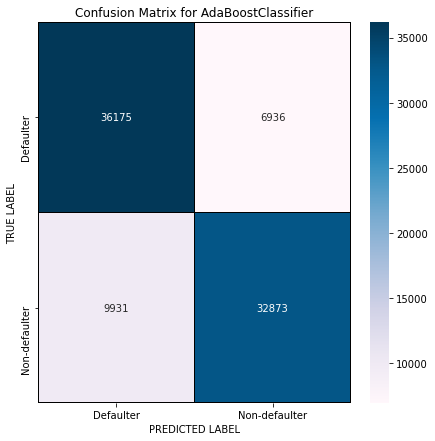

In [41]:
cm = confusion_matrix(y_test, predab)

x_axis_labels = ["Defaulter","Non-defaulter"]
y_axis_labels = ["Defaulter","Non-defaulter"]

f, ax = plt.subplots(figsize =(7,7))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="PuBu", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for AdaBoostClassifier')
plt.show()

By looking into the difference of model accuracy and cross validation score i found BaggingClassifier as the best model with 95.16% accuracy and the difference between model accuracy and cross validation score is 0.44.

#### ROC-AUC curve:

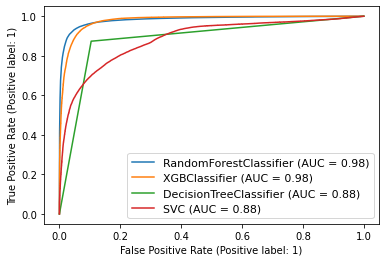

In [42]:
# Plotting ROC for all the models used here

disp = plot_roc_curve(RF,X_test,y_test)
plot_roc_curve(XGB, X_test, y_test, ax=disp.ax_)
plot_roc_curve(DTC, X_test, y_test, ax=disp.ax_)
plot_roc_curve(svc, X_test, y_test, ax=disp.ax_)

plt.legend(prop={'size':11}, loc='lower right')
plt.show()

Above is the ROC curves for all the models that i have predicted.And the AUC values can also be seen in the plot.

* AUC value is high for RandomForestClassifier and XGBClassifier.I got least difference in model accuracy and cross validation score for RandomForestClassifier so RF is my best model.

### Hyper Parameter tuning

In [43]:
parameter = {'n_jobs': [-2,-1,1],
             'n_estimators':[100,120,150,180,200],
             'criterion':['gini','entropy']}

The parameters list for bagging classifier model.

In [44]:
GCV=GridSearchCV(RandomForestClassifier(),parameter,cv=5)
GCV.fit(X_train,y_train)
GCV.best_params_

{'criterion': 'entropy', 'n_estimators': 180, 'n_jobs': -1}

In [45]:
Final_mod=RandomForestClassifier(bootstrap='True', n_jobs=-1,criterion='entropy', n_estimators=180)
Final_mod.fit(X_train,y_train)
pred=Final_mod.predict(X_test)
acc=accuracy_score(y_test, pred)

print('Accuracy Score:',(accuracy_score(y_test,pred)*100))
print('Confusion matrix:',confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy Score: 94.40842693359716
Confusion matrix: [[40811  2300]
 [ 2504 40300]]
              precision    recall  f1-score   support

           0       0.94      0.95      0.94     43111
           1       0.95      0.94      0.94     42804

    accuracy                           0.94     85915
   macro avg       0.94      0.94      0.94     85915
weighted avg       0.94      0.94      0.94     85915



Our model accuraccy has increased from 94.08% to 94.40% that's good.

#### AUC ROC CURVE for final model:

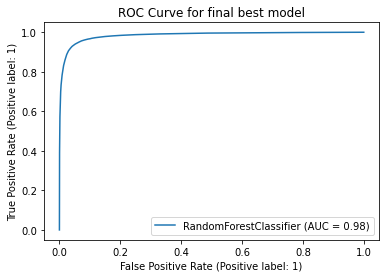

In [47]:
# ploting ROC curve for final best model
plot_roc_curve(Final_mod, X_test, y_test)
plt.title('ROC Curve for final best model')
plt.show()

### Saving the model:

In [48]:
# saving the model as .pkl file
import joblib
joblib.dump(Final_mod,"MicroCreditLoan.pkl")

['MicroCreditLoan.pkl']

### Predictions:

In [49]:
# loading the saved model
model=joblib.load("MicroCreditLoan.pkl")

# Prediction
prediction = model.predict(X_test)
prediction

array([1, 0, 1, ..., 0, 0, 1], dtype=int64)

In [50]:
pd.DataFrame([model.predict(X_test)[:],y_test[:]],index=["Predicted","Actual"])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493,494,495,496,497,498,499,500,501,502,503,504,505,506,507,508,509,510,511,512,513,514,515,516,517,518,519,520,521,522,523,524,525,526,527,528,529,530,531,532,533,534,535,536,537,538,539,540,541,542,543,544,545,546,547,548,549,550,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,589,590,591,592,593,594,595,596,597,598,599,600,601,602,603,604,605,606,607,608,609,610,611,612,613,614,615,616,617,618,619,620,621,622,623,624,625,626,627,628,629,630,631,632,633,634,635,636,637,638,639,640,641,642,643,644,645,646,647,648,649,650,651,652,653,654,655,656,657,658,659,660,661,662,663,664,665,666,667,668,669,670,671,672,673,674,675,676,677,678,679,680,681,682,683,684,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,814,815,816,817,818,819,820,821,822,823,824,825,826,827,828,829,830,831,832,833,834,835,836,837,838,839,840,841,842,843,844,845,846,847,848,849,850,851,852,853,854,855,856,857,858,859,860,861,862,863,864,865,866,867,868,869,870,871,872,873,874,875,876,877,878,879,880,881,882,883,884,885,886,887,888,889,890,891,892,893,894,895,896,897,898,899,900,901,902,903,904,905,906,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,935,936,937,938,939,940,941,942,943,944,945,946,947,948,949,950,951,952,953,954,955,956,957,958,959,960,961,962,963,964,965,966,967,968,969,970,971,972,973,974,975,976,977,978,979,980,981,982,983,984,985,986,987,988,989,990,991,992,993,994,995,996,997,998,999,1000,1001,1002,1003,1004,1005,1006,1007,1008,1009,1010,1011,1012,1013,1014,1015,1016,1017,1018,1019,1020,1021

Above are the predicted values and the actual values.They are almost similar.